## Project 1


### Import Dependencies

In [1]:
# Import libraries and dependencies
import os
import pandas as pd
import alpaca_trade_api as tradeapi
import datetime
import math
import random
import hvplot.pandas
import panel as pn
from yahoo_fin import stock_info as si
from yahoo_earnings_calendar import YahooEarningsCalendar
from MCForecastTools import MCSimulation

In [2]:
# Load .env enviroment variables
initial_investment = 10000

from dotenv import load_dotenv
load_dotenv()

True

In [3]:
### Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version = "v2"
)


In [4]:
#Ask User for intitial investment
investment_slider = pn.widgets.FloatSlider(name='Initial Investment', start=1000, end=100000, step=100, value=10000)

investment_slider

FloatSlider(end=100000, name='Initial Investment', start=1000, step=100, value=10000, value_throttled=10000)

### Dynamically Pull Stocks Based on Earnings Date

In [5]:
#Store initial investment
initial_investment = investment_slider.value
initial_investment

10000

In [6]:
#Ask the user for number of days to look at future earnings
day_slider = pn.widgets.FloatSlider(name='Please select the number of days to look at for earnings', start=1, end=25, step=1, value=2)

day_slider

FloatSlider(end=25, name='Please select t..., start=1, step=1, value=2, value_throttled=2)

In [7]:
#Store Selected days
furture_days = day_slider.value

In [8]:
today = datetime.date.today()
tomorrow = today + datetime.timedelta(days = 2) 
start_time = tomorrow.strftime("%b %d %Y") + " 10:00AM"
next_day = today + datetime.timedelta(days = 3) 
end_time = next_day.strftime("%b %d %Y") + " 1:00PM"

date_from = datetime.datetime.strptime(
    start_time, '%b %d %Y %I:%M%p')
date_to = datetime.datetime.strptime(
    end_time, '%b %d %Y %I:%M%p')
yec = YahooEarningsCalendar()
stock_earnings = yec.earnings_between(date_from, date_to)


In [9]:
stock_list = [{'ticker': ticker['ticker'], 'epsestimate': ticker['epsestimate']} for ticker in stock_earnings if ticker['epsestimate']]
tickers = []
for i in stock_list:
    if i["ticker"] not in tickers:
        tickers.append((i["ticker"]))
        
print(tickers)

['ACN', 'AIR', 'APDN', 'RAD', 'NAV', 'SCHL', 'CAMP', 'FDX', 'SAFM', 'GIS', 'OTLK', 'JBL', 'SCS', 'WOR', 'APOG', 'CCL', 'DRI', 'WGO', 'NKE']


In [10]:
tickers

['ACN',
 'AIR',
 'APDN',
 'RAD',
 'NAV',
 'SCHL',
 'CAMP',
 'FDX',
 'SAFM',
 'GIS',
 'OTLK',
 'JBL',
 'SCS',
 'WOR',
 'APOG',
 'CCL',
 'DRI',
 'WGO',
 'NKE']

In [11]:
# Set timeframe to '1D'
timeframe = "1D"

#Set timeframe for last 2 years
start_date = pd.Timestamp("2018-05-01", tz="America/New_York").isoformat()
end_date = pd.Timestamp(next_day, tz="America/New_York").isoformat()

#Get ticker data
df_ticker = api.get_barset(
    tickers,
    timeframe,
    start=start_date,
    end=end_date
).df

df_ticker.head()

ACN                                        \
                             open     high       low   close     volume   
time                                                                      
2018-05-01 00:00:00-04:00  151.09  151.950  150.1200  151.88   821409.0   
2018-05-02 00:00:00-04:00  151.72  152.090  150.4100  150.69   891638.0   
2018-05-03 00:00:00-04:00  150.30  152.040  149.1400  151.68  1181445.0   
2018-05-04 00:00:00-04:00  150.71  153.955  150.3500  153.44  1094740.0   
2018-05-07 00:00:00-04:00  152.95  153.080  151.8408  152.32  1437543.0   

                             AIR                                   ...    WGO  \
                            open   high      low  close    volume  ...   open   
time                                                               ...          
2018-05-01 00:00:00-04:00  43.20  43.57  42.5500  43.47  142770.0  ...  37.85   
2018-05-02 00:00:00-04:00  43.49  44.05  43.3500  43.41   64774.0  ...  38.75   
2018-05-03 00:00:00-04:00  43.20  43.74  42.8600  43.52   54483.0  ...  37.15   
2018-05-04 00:00:00-04:00  43.40  44.65  43.2900  44.39   66943.0  ...  36.80   
2018-05-07 00:00:00-04:00  44.49  45.49  44.0002  45.33   90957.0  ...  38.00   

                                                             WOR         \
                            high     low  close    volume   open   high   
time                                                                      
2018-05-01 00:00:00-04:00  39.00  37.525  38.65  497375.0  44.23  44.56   
2018-05-02 00:00:00-04:00  39.90  37.225  37.55  855989.0  44.59  44.82   
2018-05-03 00:00:00-04:00  37.35  35.800  36.95  462130.0  44.13  44.67   
2018-05-04 00:00:00-04:00  38.20  35.955  38.15  259106.0  43.53  44.69   
2018-05-07 00:00:00-04:00  38.50  36.200  38.40  584740.0  44.54  45.22   

                                                   
                             low  close    volume  
time                                               
2018-05-01 00:00:00-04:00  43.35  44.37  214155.0  
2018-05-02 00:00:00-04:00  43.97  44.07  153262.0  
2018-05-03 00:00:00-04:00  43.31  43.75  179879.0  
2018-05-04 00:00:00-04:00  43.24  44.36  197542.0  
2018-05-07 00:00:00-04:00  44.30  45.19  187717.0  

[5 rows x 95 columns]

In [12]:
#Cleanup Pandas Data for Close Prices only
df_closing_prices = pd.DataFrame()

for ticker in tickers: 
    df_closing_prices[ticker] = df_ticker[ticker]["close"]

In [13]:
df_closing_prices.head()

,ACN,AIR,APDN,RAD,NAV,SCHL,CAMP,FDX,SAFM,GIS,OTLK,JBL,SCS,WOR,APOG,CCL,DRI,WGO,NKE
time,,,,,,,,,,,,,,,,,,,
2018-05-01 00:00:00-04:00,151.88,43.47,1.500,1.6350,34.89,41.11,19.72,244.750,113.41,43.54,NaN,26.690,13.450,44.37,42.33,64.09,93.270,38.65,68.09
2018-05-02 00:00:00-04:00,150.69,43.41,1.480,1.6400,34.96,41.27,19.96,240.615,114.27,42.48,NaN,27.020,13.675,44.07,41.93,62.85,91.980,37.55,68.25
2018-05-03 00:00:00-04:00,151.68,43.52,1.499,1.6200,34.82,41.65,19.75,242.180,112.48,41.21,NaN,27.125,13.800,43.75,41.71,62.81,91.820,36.95,66.90
2018-05-04 00:00:00-04:00,153.44,44.39,1.530,1.6382,35.67,41.66,19.76,244.920,112.55,42.54,NaN,27.440,14.100,44.36,42.15,63.08,92.820,38.15,68.12
2018-05-07 00:00:00-04:00,152.32,45.33,1.545,1.6600,36.71,42.19,20.75,243.110,111.06,42.33,NaN,27.420,13.550,45.19,42.51,62.92,91.905,38.40,69.32


In [14]:
#Generate Closing Price Graph
df_closing_prices.index = df_closing_prices.index.date

daily_close = df_closing_prices.hvplot.line()
daily_close

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [15]:
#Generate Daily Returns Graph 
df_daily_returns = df_closing_prices.pct_change().dropna()

daily_returns = df_daily_returns.hvplot.line()
daily_returns

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [16]:
### Dynamically Generate Weights 

In [17]:
total = 1
weight_list = []
#portfolios = 5
#for num in range(len(portfolios)):
for i in range(len(tickers)):
    if i == (len(tickers)-1):
        weight_list.append(round(total,2))
    elif len(tickers) > 1 and len(tickers) <= 5:
        weight = (round(random.uniform(0,total),2))
        weight_list.append(round(weight,2))
        total -= weight
    elif len(tickers) > 5:
        weight = (round(random.uniform(0.1,total)/3,8))
        weight_list.append(round(weight,2))
        total -= weight        
    else:
        weight_list.append(1.0)
print(weight_list)

[0.22, 0.18, 0.12, 0.07, 0.1, 0.09, 0.05, 0.05, 0.04, 0.03, 0.02, 0.03, 0.03, 0.03, 0.02, 0.01, 0.03, -0.0, -0.12]


### The MCForecastTools Library at a Glance

### Simulate five year portfolio growth using Monte Carlo simulation

In [18]:
# Configuring a Monte Carlo simulation to forecast five years cumulative returns
MC_fiveyear = MCSimulation(
    portfolio_data = df_ticker,
    weights = weight_list,
    num_simulation = 500,
    num_trading_days = 252*5
)

In [19]:
# Printing the simulation input data
MC_fiveyear.portfolio_data.head()

ACN                                        \
                             open     high       low   close     volume   
time                                                                      
2018-05-01 00:00:00-04:00  151.09  151.950  150.1200  151.88   821409.0   
2018-05-02 00:00:00-04:00  151.72  152.090  150.4100  150.69   891638.0   
2018-05-03 00:00:00-04:00  150.30  152.040  149.1400  151.68  1181445.0   
2018-05-04 00:00:00-04:00  150.71  153.955  150.3500  153.44  1094740.0   
2018-05-07 00:00:00-04:00  152.95  153.080  151.8408  152.32  1437543.0   

                                          AIR                         ...  \
                          daily_return   open   high      low  close  ...   
time                                                                  ...   
2018-05-01 00:00:00-04:00          NaN  43.20  43.57  42.5500  43.47  ...   
2018-05-02 00:00:00-04:00    -0.007835  43.49  44.05  43.3500  43.41  ...   
2018-05-03 00:00:00-04:00     0.006570  43.20  43.74  42.8600  43.52  ...   
2018-05-04 00:00:00-04:00     0.011603  43.40  44.65  43.2900  44.39  ...   
2018-05-07 00:00:00-04:00    -0.007299  44.49  45.49  44.0002  45.33  ...   

                              WGO                                  WOR         \
                              low  close    volume daily_return   open   high   
time                                                                            
2018-05-01 00:00:00-04:00  37.525  38.65  497375.0          NaN  44.23  44.56   
2018-05-02 00:00:00-04:00  37.225  37.55  855989.0    -0.028461  44.59  44.82   
2018-05-03 00:00:00-04:00  35.800  36.95  462130.0    -0.015979  44.13  44.67   
2018-05-04 00:00:00-04:00  35.955  38.15  259106.0     0.032476  43.53  44.69   
2018-05-07 00:00:00-04:00  36.200  38.40  584740.0     0.006553  44.54  45.22   

                                                                
                             low  close    volume daily_return  
time                                                            
2018-05-01 00:00:00-04:00  43.35  44.37  214155.0          NaN  
2018-05-02 00:00:00-04:00  43.97  44.07  153262.0    -0.006761  
2018-05-03 00:00:00-04:00  43.31  43.75  179879.0    -0.007261  
2018-05-04 00:00:00-04:00  43.24  44.36  197542.0     0.013943  
2018-05-07 00:00:00-04:00  44.30  45.19  187717.0     0.018711  

[5 rows x 114 columns]

In [20]:
# Running a Monte Carlo simulation to forecast five years cumulative returns
MC_fiveyear.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000e+00,1.000000,...,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000
1,1.077929,9.275084e-01,1.023505,0.966326,6.558329e-01,1.018752,0.785643,1.195798,1.193332e+00,1.092041,...,1.048419,0.652326,8.319023e-01,1.066700,1.044276,1.367926,9.327898e-01,9.082174e-01,1.066642,1.023552
2,0.879052,8.630921e-01,1.212689,0.882983,6.619575e-01,1.134948,0.841043,1.146712,1.080030e+00,0.874304,...,1.655207,0.727141,6.204432e-01,0.538341,0.864951,1.387510,5.700677e-01,9.912851e-01,1.113842,0.946201
3,0.830839,1.135787e+00,1.339311,1.073243,4.583123e-01,0.564141,0.631191,1.239602,8.848220e-01,1.073862,...,1.585662,0.600217,4.573432e-01,0.531292,1.087680,1.818682,3.594985e-01,1.169582e+00,1.077150,0.852698
4,0.985892,8.670701e-01,1.182487,1.117508,5.365276e-01,0.518492,0.691469,1.520563,1.153368e+00,0.568436,...,1.366114,0.553316,4.529646e-01,0.603215,1.189368,1.410010,3.945538e-01,1.152041e+00,1.055348,0.619683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,0.000003,8.022456e-07,0.041792,0.000235,5.904752e-09,0.000001,0.000012,0.000004,4.837795e-07,0.010620,...,0.000001,0.000034,1.236112e-07,0.000041,0.000002,0.000097,1.384161e-08,1.701747e-07,0.002416,0.000003
1257,0.000004,8.221087e-07,0.038550,0.000152,6.051961e-09,0.000001,0.000012,0.000005,4.248296e-07,0.010810,...,0.000002,0.000040,1.484335e-07,0.000049,0.000002,0.000099,1.963696e-08,1.260350e-07,0.002852,0.000002
1258,0.000003,7.263045e-07,0.034189,0.000130,6.714220e-09,0.000002,0.000010,0.000006,5.986625e-07,0.010676,...,0.000002,0.000038,1.565527e-07,0.000042,0.000002,0.000101,2.105108e-08,1.572041e-07,0.003728,0.000003
1259,0.000003,5.283525e-07,0.026218,0.000093,7.502815e-09,0.000002,0.000010,0.000004,5.005822e-07,0.007519,...,0.000003,0.000036,1.846044e-07,0.000043,0.000002,0.000108,2.244134e-08,1.936561e-07,0.004310,0.000003


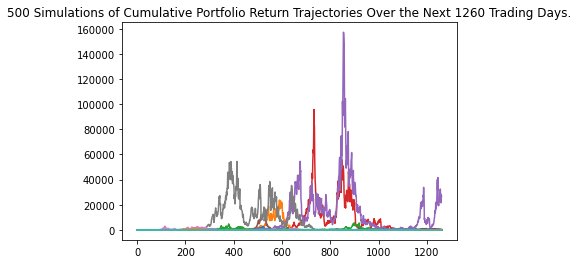

In [21]:
# Plot simulation outcomes
line_plot = MC_fiveyear.plot_simulation()

# Save the plot for future usage
line_plot.get_figure().savefig("MC_fiveyear_sim_plot.png", bbox_inches="tight")

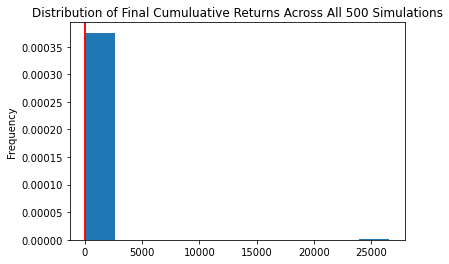

In [22]:
# Plot probability distribution and confidence intervals
dist_plot = MC_fiveyear.plot_distribution()

# Save the plot for future usage
dist_plot.get_figure().savefig('MC_fiveyear_dist_plot.png',bbox_inches='tight')

In [23]:
# Fetch summary statistics from the Monte Carlo simulation results
tbl = MC_fiveyear.summarize_cumulative_return()

# Print summary statistics
tbl

count           5.000000e+02
mean            5.491885e+01
std             1.188851e+03
min             8.996846e-15
25%             2.168742e-08
50%             2.488828e-06
75%             3.356681e-04
max             2.658141e+04
95% CI Lower    4.148544e-12
95% CI Upper    4.217501e+00
Name: 1260, dtype: float64

In [24]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in Coca-Cola and Microsoft stocks
ci_lower = round(tbl[8]*initial_investment,2)
ci_upper = round(tbl[9]*initial_investment,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

There is a 95% chance that an initial investment of $10000 in the portfolio over the next 5 years will end within in the range of $0.0 and $42175.01


In [25]:
portfolio = {}
for ticker in tickers:
    stock_weight = weight_list[tickers.index(ticker)] * initial_investment
    current_stock_price = round(si.get_live_price(ticker),2)
    portfolio_weight = stock_weight//current_stock_price
    portfolio[ticker] = math.floor(portfolio_weight)

for key in portfolio.keys():
    mystring = f"Buy {key}: {portfolio[key]} shares"
    print(mystring)

Buy ACN: 8 shares
Buy AIR: 50 shares
Buy APDN: 205 shares
Buy RAD: 38 shares
Buy NAV: 22 shares
Buy SCHL: 33 shares
Buy CAMP: 45 shares
Buy FDX: 1 shares
Buy SAFM: 2 shares
Buy GIS: 5 shares
Buy OTLK: 153 shares
Buy JBL: 7 shares
Buy SCS: 21 shares
Buy WOR: 5 shares
Buy APOG: 6 shares
Buy CCL: 4 shares
Buy DRI: 2 shares
Buy WGO: 0 shares
Buy NKE: -9 shares


In [26]:
df_shares = pd.DataFrame(list(portfolio.items()),columns = ['ticker','shares'])
df_shares.set_index(['ticker'], inplace=True)
df_shares

,shares
ticker,
ACN,8
AIR,50
APDN,205
RAD,38
NAV,22
SCHL,33
CAMP,45
FDX,1
SAFM,2


In [27]:
#plot = df_shares.plot.pie(subplots=True,figsize=(5, 5))

In [28]:
# imports
import panel as pn
import numpy as np
import holoviews as hv
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv
pn.extension()
import holoviews as hv
import holoviews.plotting.bokeh



In [29]:
closing_line= df_closing_prices.hvplot.line()
closing_line

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [30]:
return_line= df_daily_returns.hvplot.line()
return_line


:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [31]:
df_closing_prices.head()

,ACN,AIR,APDN,RAD,NAV,SCHL,CAMP,FDX,SAFM,GIS,OTLK,JBL,SCS,WOR,APOG,CCL,DRI,WGO,NKE
2018-05-01,151.88,43.47,1.500,1.6350,34.89,41.11,19.72,244.750,113.41,43.54,NaN,26.690,13.450,44.37,42.33,64.09,93.270,38.65,68.09
2018-05-02,150.69,43.41,1.480,1.6400,34.96,41.27,19.96,240.615,114.27,42.48,NaN,27.020,13.675,44.07,41.93,62.85,91.980,37.55,68.25
2018-05-03,151.68,43.52,1.499,1.6200,34.82,41.65,19.75,242.180,112.48,41.21,NaN,27.125,13.800,43.75,41.71,62.81,91.820,36.95,66.90
2018-05-04,153.44,44.39,1.530,1.6382,35.67,41.66,19.76,244.920,112.55,42.54,NaN,27.440,14.100,44.36,42.15,63.08,92.820,38.15,68.12
2018-05-07,152.32,45.33,1.545,1.6600,36.71,42.19,20.75,243.110,111.06,42.33,NaN,27.420,13.550,45.19,42.51,62.92,91.905,38.40,69.32


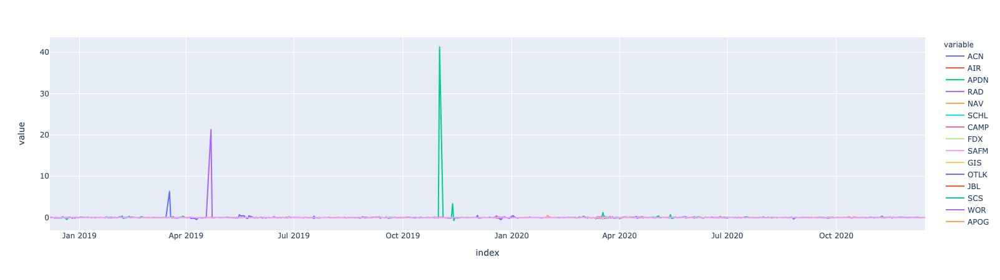

In [32]:
return_line_graph = px.line(df_daily_returns)
return_line_graph.show()

In [33]:
sharpe_ratios = (df_daily_returns.mean() * 252) / (df_daily_returns.std() * np.sqrt(252))
Sharpe_ratio_plot=sharpe_ratios.hvplot.bar(title= "Sharpe Ratios")
Sharpe_ratio_plot

:Bars   [index]   (0)

In [34]:
plot = df_shares.hvplot.bar(size=10)
plot

:Bars   [ticker]   (shares)

In [35]:
tbl = MC_fiveyear.summarize_cumulative_return()
tbl

count           5.000000e+02
mean            5.491885e+01
std             1.188851e+03
min             8.996846e-15
25%             2.168742e-08
50%             2.488828e-06
75%             3.356681e-04
max             2.658141e+04
95% CI Lower    4.148544e-12
95% CI Upper    4.217501e+00
Name: 1260, dtype: float64

In [36]:
ci_lower = round(tbl[8]*initial_investment,2)
ci_upper = round(tbl[9]*initial_investment,2)
text = pn.pane.Markdown(f" **Summary** : There is a **95%** chance that an initial investment of **${initial_investment}** in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" **${ci_lower}** and **${ci_upper}**")

text2 = pn.pane.Markdown(f" **Portfolio Forecasting** : Let's determine your returns based on an initial investment of your choosing.")

In [37]:
investment_slider1 = pn.widgets.FloatSlider(name='Initial Investment', start=1000, end=100000, step=100, value=10000)
day_slider = pn.widgets.FloatSlider(name='Please select the number of days to look at for earnings', start=1, end=25, step=1, value=2)

tabs = pn.Tabs(('Daily Returns ',return_line_graph),
               ('Sharpe Ratios',Sharpe_ratio_plot), 
              ('Closing Price',closing_line),

              ('Share', plot),)

Dashboard = pn.Row(pn.Column('### Portfolio Analysis',text,investment_slider1,day_slider,width=400), tabs ,width=900)


Dashboard.servable()


pn.extension('plotly')

2020-12-15 19:42:42,476 param.Daily Returns  WARNING  PlotlyPlot was not imported on instantiation and may not render in a notebook. Restart the notebook kernel and ensure you load it as part of the extension using:

pn.extension('plotly')



Row(width=900)
    [0] Column(width=400)
        [0] Markdown(str)
        [1] Markdown(str)
        [2] FloatSlider(end=100000, name='Initial Investment', start=1000, step=100, value=10000, value_throttled=10000)
        [3] FloatSlider(end=25, name='Please select t..., start=1, step=1, value=2, value_throttled=2)
    [1] Tabs
        [0] Plotly(Figure, name='Daily Returns ')
        [1] HoloViews(Bars, name='Sharpe Ratios')
        [2] HoloViews(NdOverlay, name='Closing Price')
        [3] HoloViews(Bars, name='Share')

In [38]:
pn.serve(Dashboard)

Launching server at http://localhost:53042
